# Header
Author: Wang Dong  
Email: wang0dong@gmail.com, dwang2014@my.fit.edu  
Date: 10/18/2023  

In [35]:
# Libraries 
import os
import imageio
# import json
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import copy
import datetime
import time

In [36]:
# function definition
    
# projecting
def projecting(pmatrix, points):
    points_transpose= points.transpose()
    pionts_tilde = np.block([[points_transpose],[np.ones([1,np.shape(points_transpose)[1]])]])
    x_tilde = pmatrix @ pionts_tilde

    # Convert coordinates from homogeneous to Cartesian
    x = np.zeros([2,np.shape(points_transpose)[1]])          # Create matrix to store image coords                          
    x[0][:] = x_tilde[0][:] / x_tilde[2][:]   # Vectorized division (avoid using loops!) 
    x[1][:] = x_tilde[1][:] / x_tilde[2][:]
    
    return x.transpose()

# plotting
def plotting(x, img, Lambda, dist):
#     Lambda # Intrinsic params.
#     dist   # Lens distortion
    img_corrected = cv.undistort(img, Lambda, dist)
    img_corrected = img
    plt.figure(figsize=(10,6))
    plt.imshow(img_corrected, aspect='auto')

    for i in range(0, int(len(x)/2)):
        xx = [x[i][0],x[i+4][0]]
        yy = [x[i][1],x[i+4][1]]
        plt.plot(xx,yy, 'ro-')
    for i in range(0, int(len(x))):
        if i == 3 or i == 7:
            xx = [x[i][0],x[i-3][0]]
            yy = [x[i][1],x[i-3][1]]
        else:
            xx = [x[i][0],x[i+1][0]]
            yy = [x[i][1],x[i+1][1]]
        plt.plot(xx,yy, 'ro-')

    # Get the current date and time
    current_datetime = datetime.datetime.now()        
    # Format the date and time as a string
    timestamp = current_datetime.strftime("%S")
    # Create a file name with the timestamp
    file_name = f"sample_{timestamp}.jpg"
    plt.savefig(file_name, dpi=200)
    time.sleep(1)
    
# Define the path to the MP4 video file
def read_frame(video_path, frame_number_to_read):

    # Create a video reader object using imageio
    video_reader = imageio.get_reader(video_path)
#     video_reader = iio.imread(video, index=None)

    frame = video_reader.get_data(frame_number_to_read)
#     print(frame.shape)
#     # Opencv uses BGR so we convert to RGB here 
    # Close the video reader
    video_reader.close()

    return frame


In [17]:
# Constant
virtualcube = np.array([
                       [0,0,0.0],
                       [4318,0,0.0],
                       [4318,2794,0.0],        
                       [0,2794,0.0],
                       [0,0,500],
                       [4318,0,500],
                       [4318,2794,500],        
                       [0,2794,500]
                        ])

# vidoe
video = 'VID20231003204907.mp4'
# Calibration images
calibration_images = [
                "CB01.jpg",
                "CB02.jpg",
                "CB03.jpg",
                "CB04.jpg",
                "CB05.jpg",
                "CB06.jpg",
                "CB07.jpg",
                "CB08.jpg",
                "CB09.jpg",
                "CB10.jpg",
                "CB11.jpg",
                "CB12.jpg",
                "CB13.jpg",
                "CB14.jpg",
                "CB15.jpg",
                "CB16.jpg",
                "CB17.jpg",
                "CB18.jpg"]  


# For example, if you're calibrating a chessboard pattern with 10x7 corners and squares of size 0.025 meters
# square_size = 0.0185 # scale down on monitor display 
# square_size = 0.0185 * 1000 # mm
square_size = 0.025 * 1000  # mm
rows, cols = 10, 7

# model points
modelCorners = np.float32([[0,0],[4318,0],[4318,2794],[0,2794]]) # clock wise
modelCorners = modelCorners.T
frameidx = [20, 30, 40, 50, 60, 70, 80, 90]
# frameidx = [50, 60, 90]

# Image features (corners) hardcoded
features = [] 
# # frame index 0
# imageCorners = np.float32([[954,828],[1407,785],[1408,426],[960,382]])
# imageCorners = imageCorners.T;
# features.append(imageCorners)
# # frame index 1
# imageCorners = np.float32([[968,815],[1428,766],[1425,402],[967,365]])
# imageCorners = imageCorners.T;
# features.append(imageCorners)
# frame index 2
imageCorners = np.float32([[969,800],[1447,744],[1441,373],[962,344]])
imageCorners = imageCorners.T;
features.append(imageCorners)
# frame index 3
imageCorners = np.float32([[903,818],[1417,755],[1409,375],[893,355]])
imageCorners = imageCorners.T;
features.append(imageCorners)
# frame index 4
imageCorners = np.float32([[788,816],[1369,751],[1358,355],[774,348]])
imageCorners = imageCorners.T;
features.append(imageCorners)
# frame index 5
imageCorners = np.float32([[758,734],[1407,691],[1402,270],[745,273]])
imageCorners = imageCorners.T;
features.append(imageCorners)
# frame index 6
imageCorners = np.float32([[857,704],[1544,694],[1543,242],[847,266]])
imageCorners = imageCorners.T;
features.append(imageCorners)
# frame index 7
imageCorners = np.float32([[708,757],[1396,767],[1396,304],[707, 329]])
imageCorners = imageCorners.T;
features.append(imageCorners)
# frame index 8
imageCorners = np.float32([[552,780],[1182,800],[1181,347],[553,373]])
imageCorners = imageCorners.T;
features.append(imageCorners)
# frame index 9
imageCorners = np.float32([[529,714],[1080,741],[1084,311],[531,340]])
imageCorners = imageCorners.T;
features.append(imageCorners)


Camera Matrix:
[[ 1601.12  0.00  1088.31]
 [ 0.00  1590.57  845.21]
 [ 0.00  0.00  1.00]]

Distortion Coefficients:
[[ 0.04 -0.45  0.01  0.01  0.68]]


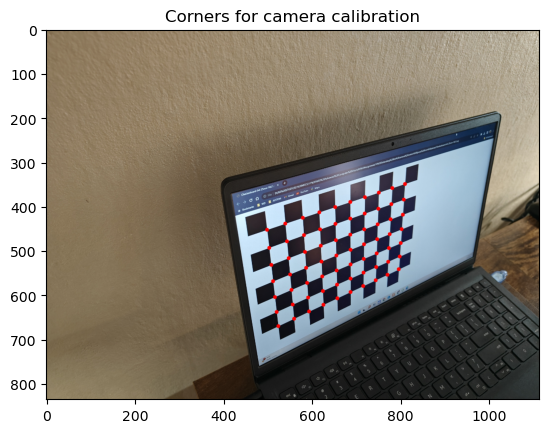

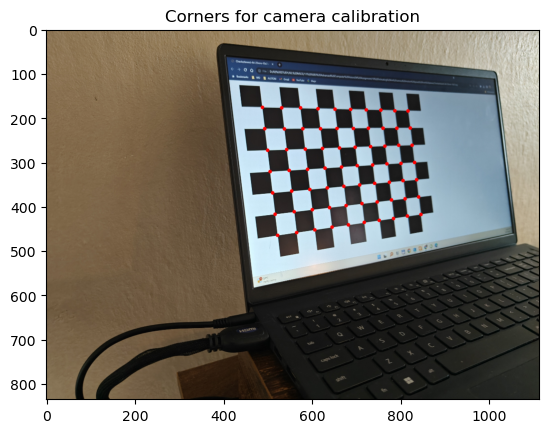

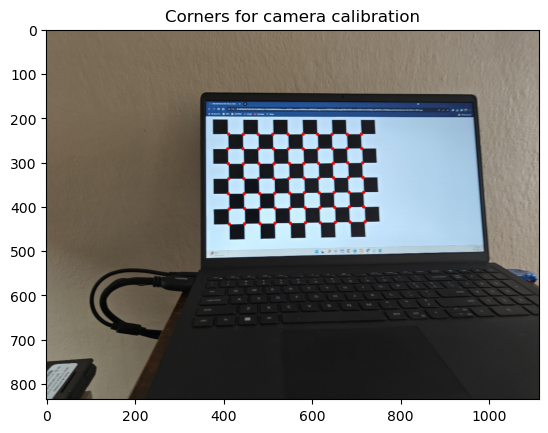

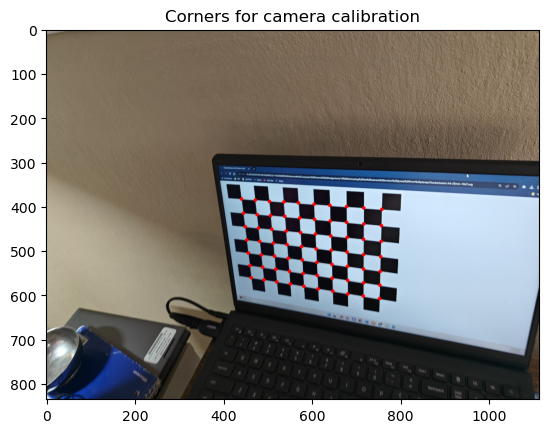

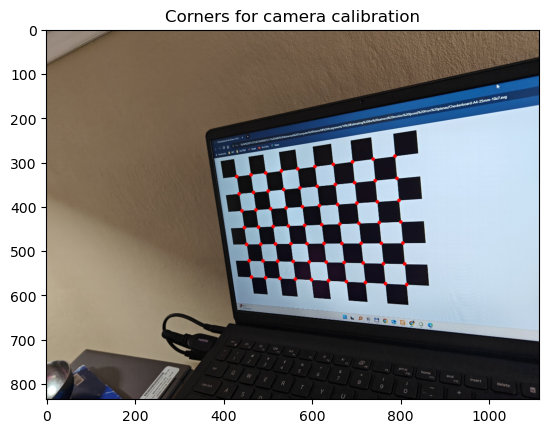

...

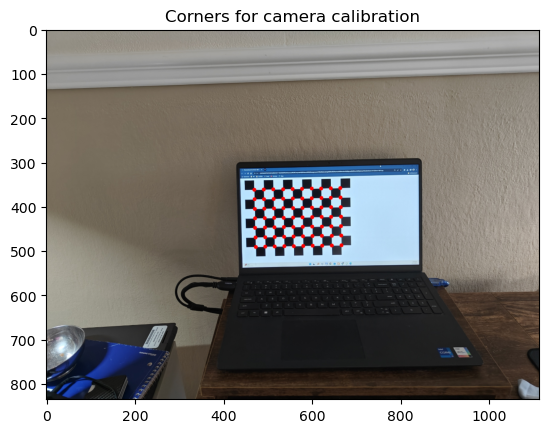

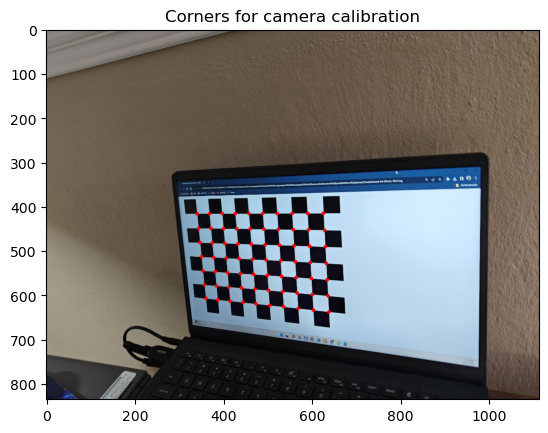

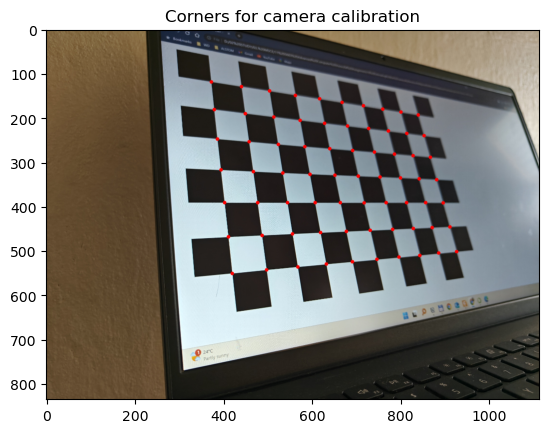

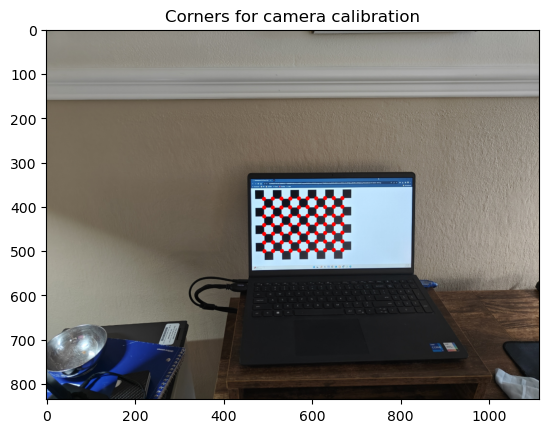

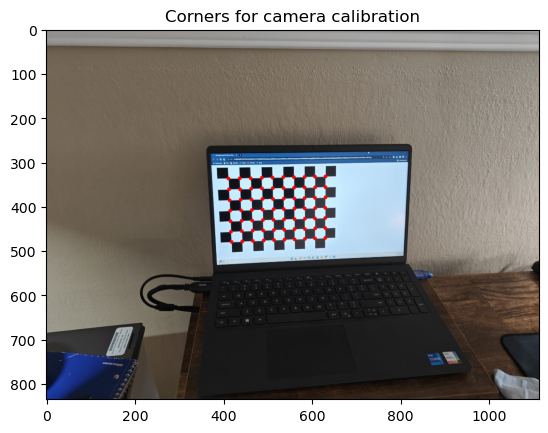

In [18]:
# Calibrate the camera for the intrinsic parameters
# Disable the Qt backend for pop-up window
%matplotlib inline

# Define the 3D object points (known 3D coordinates of calibration points)
object_points = []

for row in range(rows):
    for col in range(cols):
        object_points.append([col * square_size, row * square_size, 0])

# Create lists to store 3D object points and 2D image points from calibration images
object_points_list = []  # 3D object points for each image
image_points_list = []   # 2D image points for each image

# Loop through calibration images
for image_file in calibration_images:
#     # read online images
#     req  = urllib.request.urlopen(image_file)
#     arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
#     image = cv.imdecode(arr, -1) # 'Load it as it is'
#     gray = cv.cvtColor(image, cv.COLOR_BGR2RGB)

    # read local images
    image = cv.imread(image_file)
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Find chessboard corners (you can use a different pattern if needed)
    ret, corners = cv.findChessboardCorners(gray, (cols, rows), None)

    # Draw the refined corners on the image
    for corner in corners:
        x, y = corner.ravel()
        cv.circle(image, (int(x), int(y)), 8, (0,0,255), -1)

    # Display the image with refined corners
    fig, ax = plt.subplots()
    imS = cv.resize(image, (1113, 835)) 
    imsRGB = cv.cvtColor(imS, cv.COLOR_BGR2RGB)
    ax.imshow(imsRGB)
    plt.title('Corners for camera calibration')    

#     cv.imshow('Corners', imS)
#     cv.waitKey(0)
#     cv.destroyAllWindows()
    
    if ret:
        object_points_list.append(object_points)
        image_points_list.append(corners)

# Perform camera calibration
ret, camera_matrix, distortion_coeffs, rvecs, tvecs = cv.calibrateCamera(
    np.float32(object_points_list), np.float32(image_points_list), gray.shape[::-1], None, None)

# Print camera matrix and distortion coefficients
print("Camera Matrix:")
print(camera_matrix)
print("\nDistortion Coefficients:")
print(distortion_coeffs)

The frame size for reading (1920, 1080) is different from the source frame size (1080, 1920).


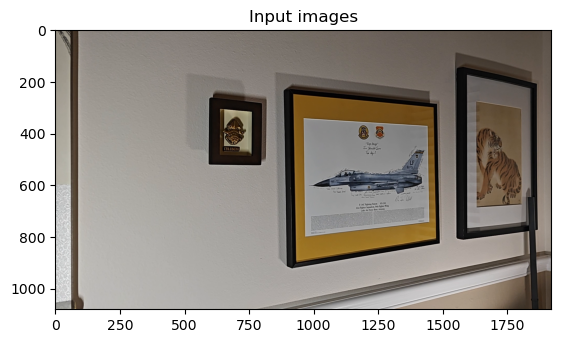

The frame size for reading (1920, 1080) is different from the source frame size (1080, 1920).


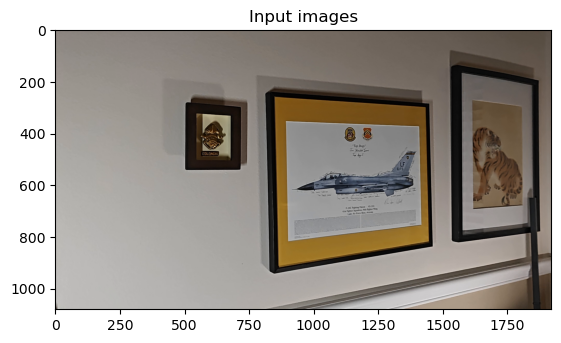

The frame size for reading (1920, 1080) is different from the source frame size (1080, 1920).


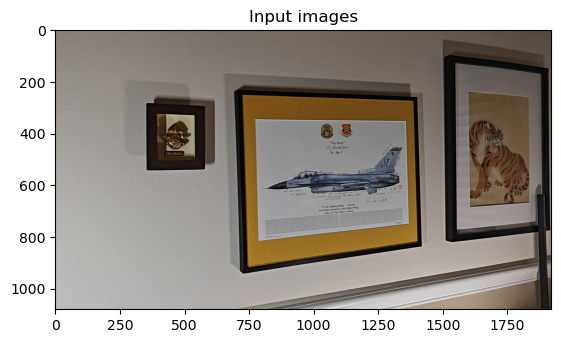

The frame size for reading (1920, 1080) is different from the source frame size (1080, 1920).


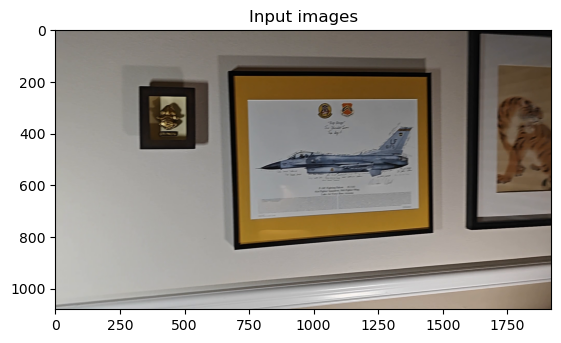

The frame size for reading (1920, 1080) is different from the source frame size (1080, 1920).


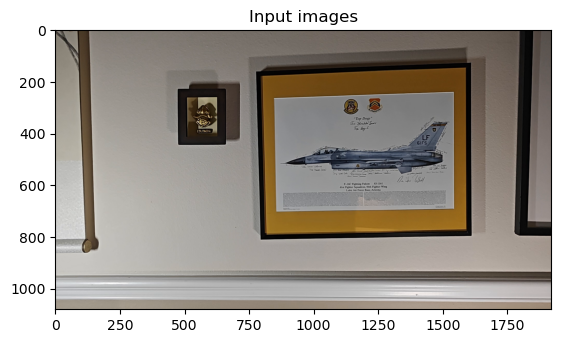

The frame size for reading (1920, 1080) is different from the source frame size (1080, 1920).


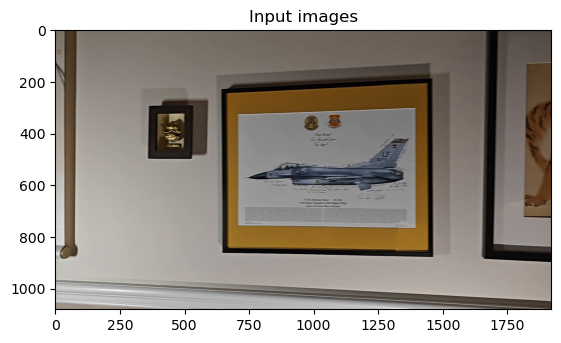

The frame size for reading (1920, 1080) is different from the source frame size (1080, 1920).


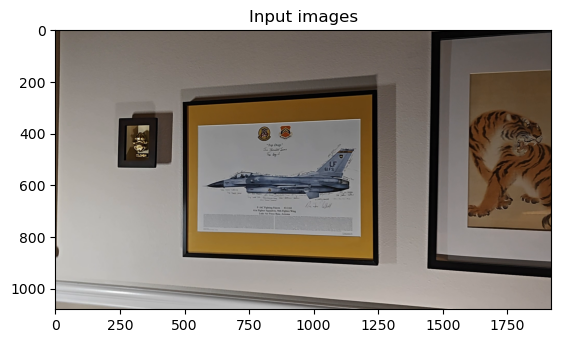

The frame size for reading (1920, 1080) is different from the source frame size (1080, 1920).


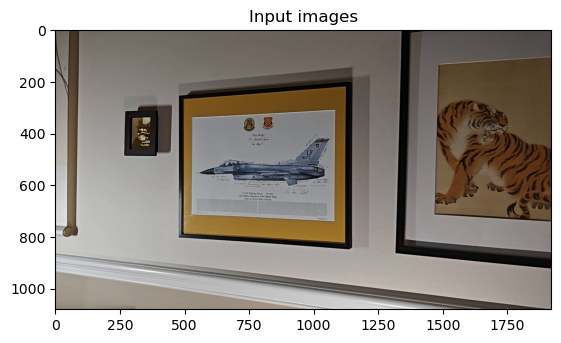

In [19]:
# Disable the Qt backend for pop-up window
%matplotlib inline
# video reading
imgs = []
for idx in range(len(frameidx)):
    # frame size warning explaination https://github.com/imageio/imageio/issues/252
    image= read_frame(video, frameidx[idx]) 
    imageRGB = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    cv.imwrite('frame_%s.png' %(idx), imageRGB)
    im = np.asarray(image)
    plt.imshow(im)
    plt.title('Input images')
    plt.show()
    imgs.append(im)

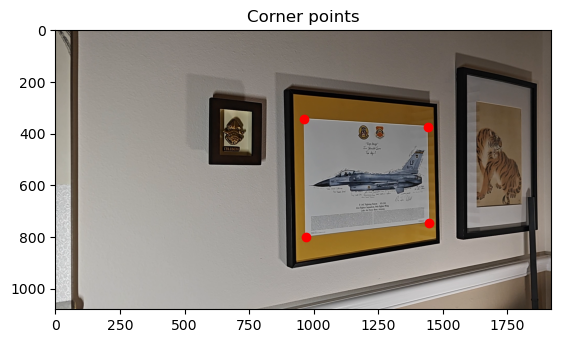

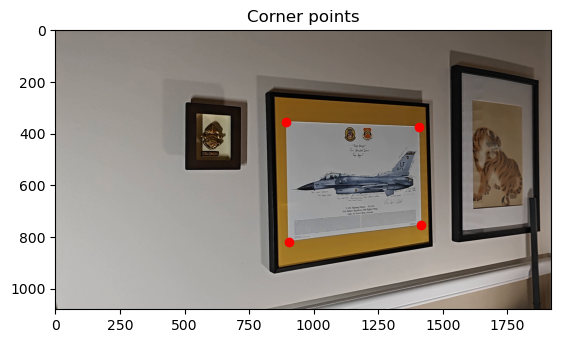

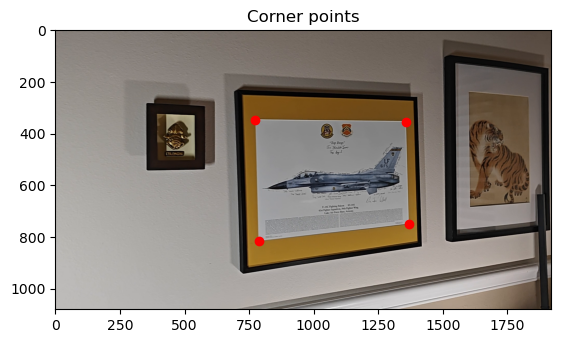

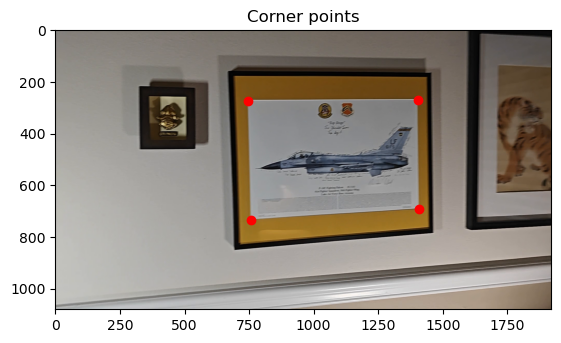

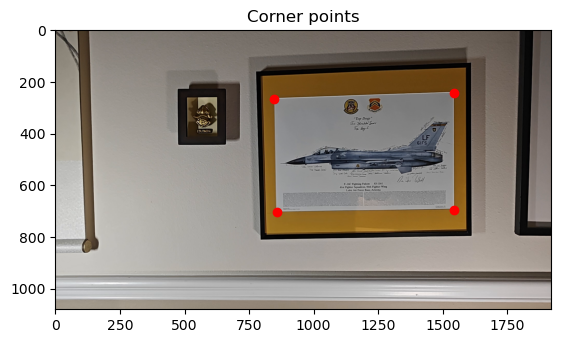

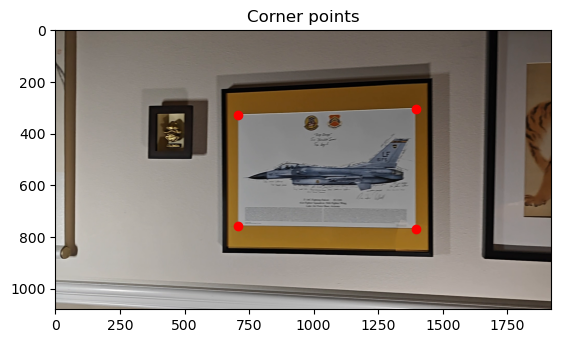

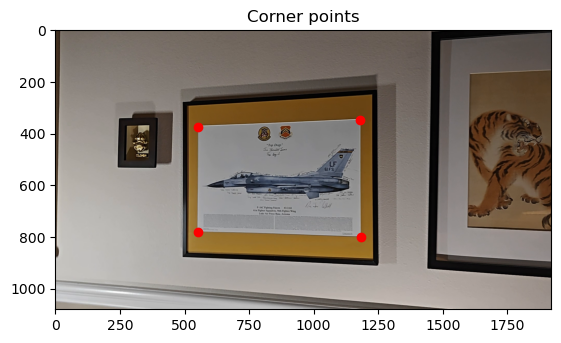

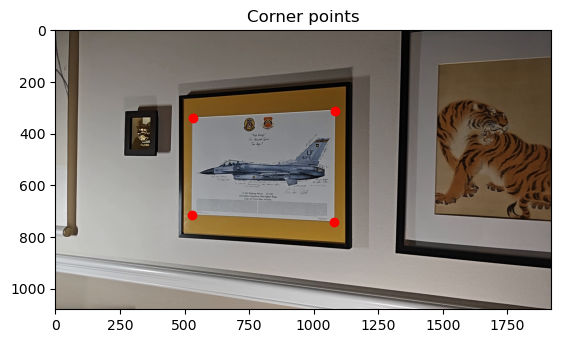

In [20]:
# Disable the Qt backend for pop-up window
%matplotlib inline

# hardcoded  points in three frames
for idx in range(len(imgs)):
    im = imgs[idx]
    imageCorners = features[idx]
#     print(im.shape)
    # Display corners on image
    fig, ax = plt.subplots()
    ax.imshow(im)
    ax.plot(imageCorners[0,:], imageCorners[1,:], 'ro', linewidth=10)
    plt.title('Corner points')

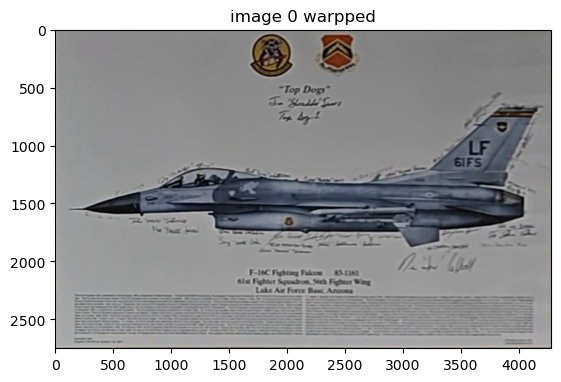

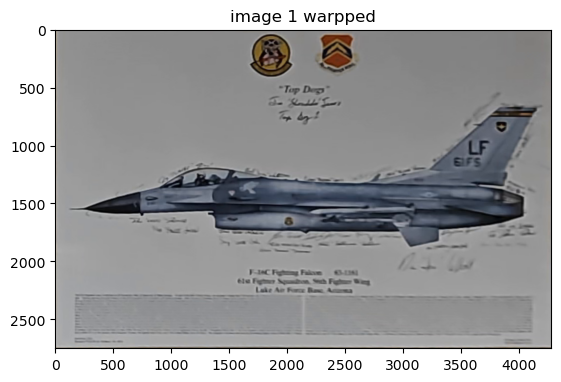

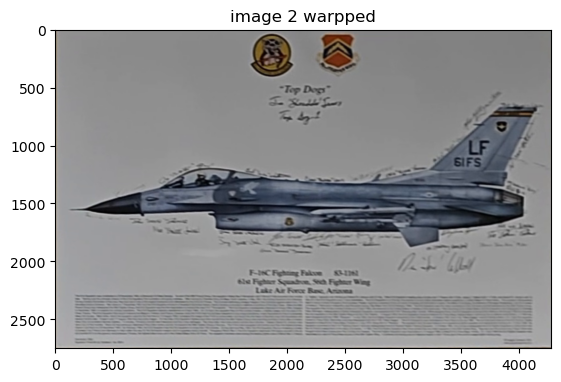

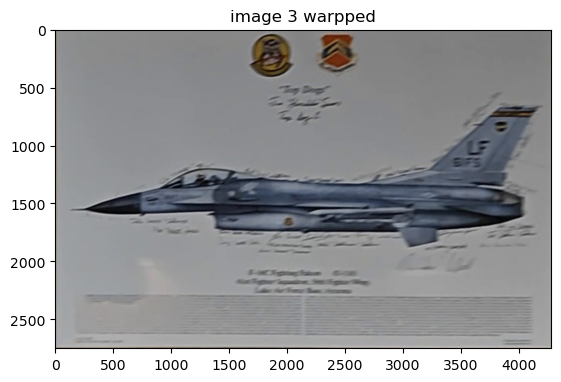

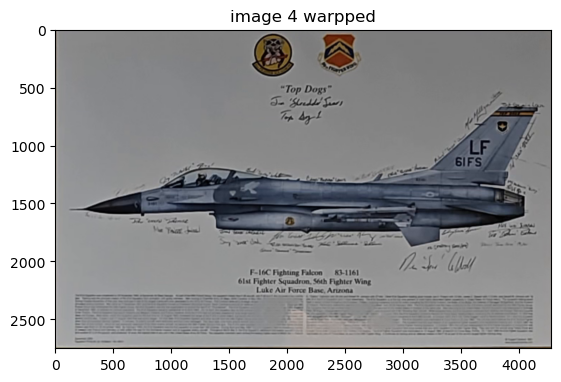

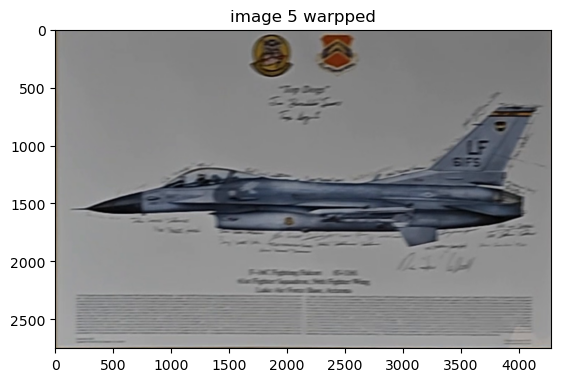

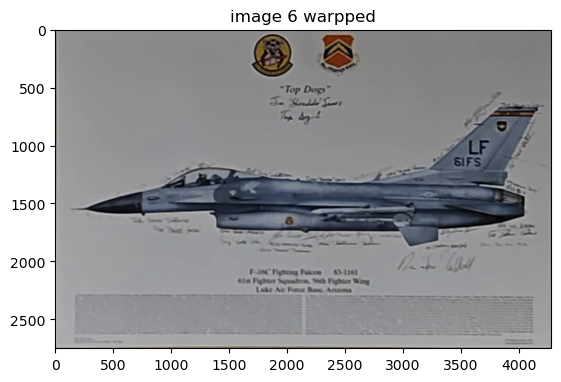

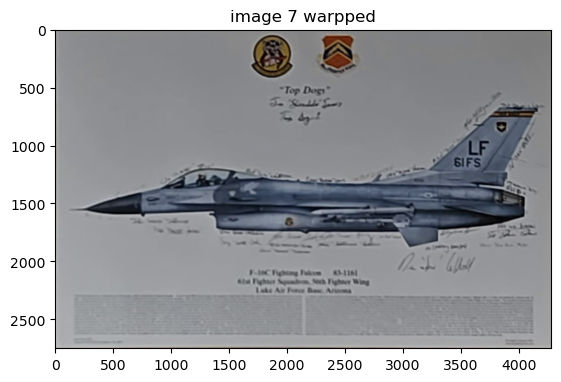

In [21]:
# Etimate the homography transformation between the plane in the scene and the camera.
# Forize the homography matrix to extract the camera rotation and translation.

# Disable the Qt backend for pop-up window
%matplotlib inline
np.set_printoptions(precision=5) 

cameraTransform = []
for idx in range(len(features)):
    # Model coordinates 
    u = modelCorners[0,:]
    v = modelCorners[1,:]
    # Image coordinates
    imageCorners = features[idx]
    x = imageCorners[0,:]
    y = imageCorners[1,:]

    # Build the system matrix to solve for the homography
    I = 4   # Number of features 
    j = 0;
    A = np.zeros( (2*I, 9) )
    for i in range(0,I):
        A[j    ,:]  = [    0,         0,     0,    -u[i],   -v[i],     -1,    y[i]*u[i],      y[i]*v[i],    y[i] ]
        A[j+1  ,:]  = [  u[i],     v[i],     1,        0,       0,     0,   -x[i]*u[i],     -x[i]*v[i],   -x[i] ]
        j = j + 2 

    np.set_printoptions(formatter={'float': '{: 0.2f}'.format},suppress=True)    
    # print("A = \n", A) 

    # SVD of A
    U,D,Vt = np.linalg.svd(A)
    # print("Vt = \n", Vt)

    # Solution is the last column of V
    Phi_hat = Vt.T[:,-1]

    # Re-shape into matrix form 
    Phi =  np.float32(
            [[ Phi_hat[0],   Phi_hat[1],    Phi_hat[2] ],
            [ Phi_hat[3],   Phi_hat[4],    Phi_hat[5] ],
            [ Phi_hat[6],   Phi_hat[7],    Phi_hat[8] ]]
           )

    # print("Phi = \n", Phi)
    
    # Warp image using the estimated homography
    dstImage = cv.warpPerspective(imgs[idx],np.linalg.inv(Phi),(4280,2750))
    reversed_dstImage = np.flipud(dstImage)
    plt.imshow(reversed_dstImage)
    plt.title('image %i warpped' %idx)
    plt.show()

    # Factorize the homography matrix to extract the camera rotation and translation
    # eliminate the effect of the intrinsic parameters by pre-multiplying the estimated 
    # homography by the inverse of the intrinsic matrix 
    Phiap = np.linalg.inv(camera_matrix) @ Phi
    # SVD of first two columns of Φ'
    Phiaptwocol= np.delete(Phiap, -1, axis=1)
    Phiaplascol = Phiap[:,-1]
    U,L,Vt = np.linalg.svd(Phiaptwocol)

#     print("U = \n", U)
#     print("Vt = \n", Vt)
#     print("L = \n", L)

    # find the closest valid first two columns of a rotation matrix 
    x = np.array([[1, 0], [0, 1], [0, 0]], np.int32)
    rmatrixfirsttwo = U @ x @ Vt
    rmatrixlast = np.cross(rmatrixfirsttwo[:,0], rmatrixfirsttwo[:,1])
#     rmatrixlast = np.cross(rmatrixfirsttwo[:,1], rmatrixfirsttwo[:,0])
    rmatrixlast = rmatrixlast.reshape((len(rmatrixlast),1))
    rmatrix = np.concatenate((rmatrixfirsttwo, rmatrixlast), axis = 1)
#     print(rmatrix)
    # Check that determinant is not minus 1
    if np.linalg.det(rmatrix) == -1:
        rmatrix = np.concatenate((rmatrixfirsttwo, -1 * rmatrixlast), axis = 1)
#         print(rmatrix)

    # estimate the scaling factor λ0 by taking the average of the scaling factors between these six elements
#     lambdaap = np.mean(np.divide(rmatrixfirsttwo, Phiaptwocol))
    lambdaap = np.mean(np.divide(Phiaptwocol, rmatrixfirsttwo))
    
    # translation vector tau
    tau = Phiaplascol / lambdaap
    tau = tau.reshape(len(tau),1)
#     tau = tau / 1000 # scale down
    camera = np.append(rmatrix, tau, axis = 1)
#     print(camera)
#     camera = np.append(camera, [[0,0,0,1]], axis = 0)
    cameraTransform.append(camera)
    

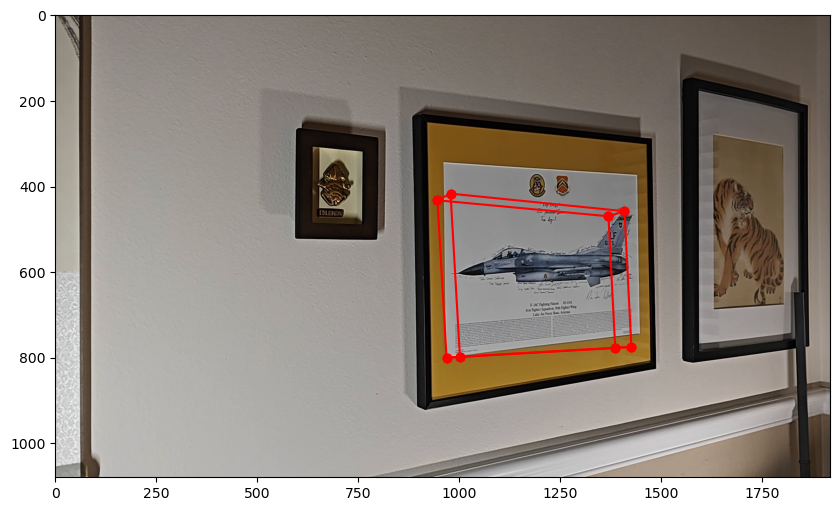

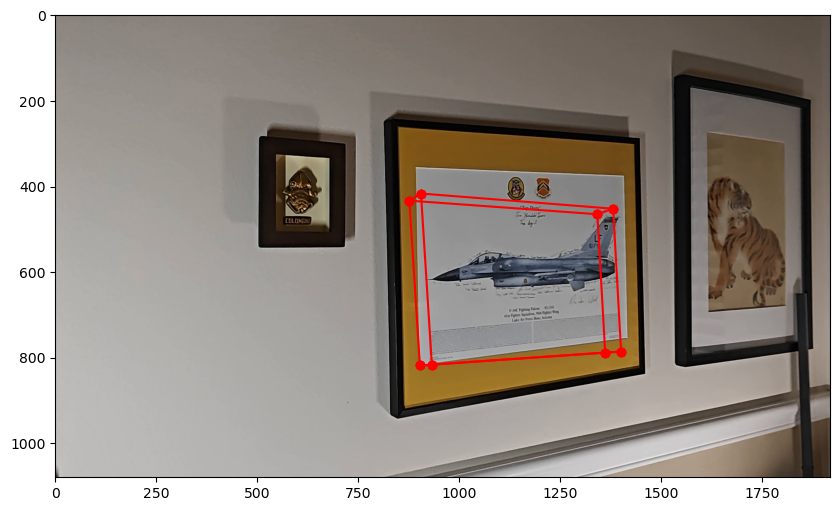

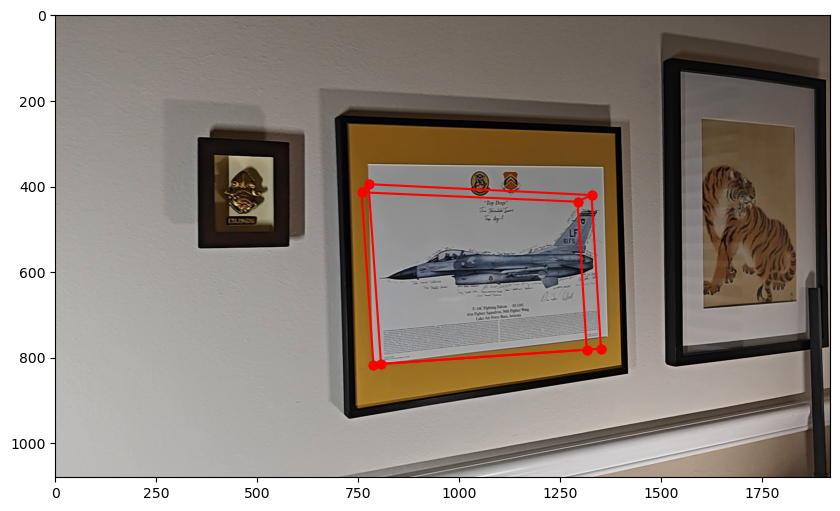

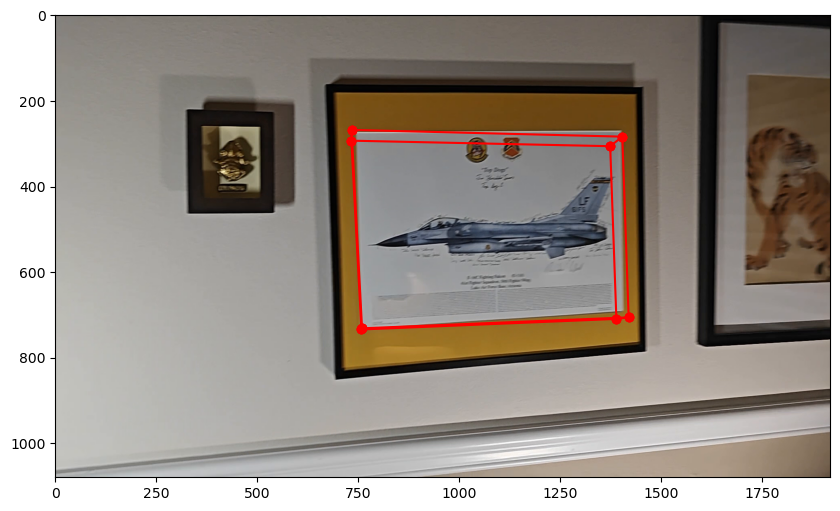

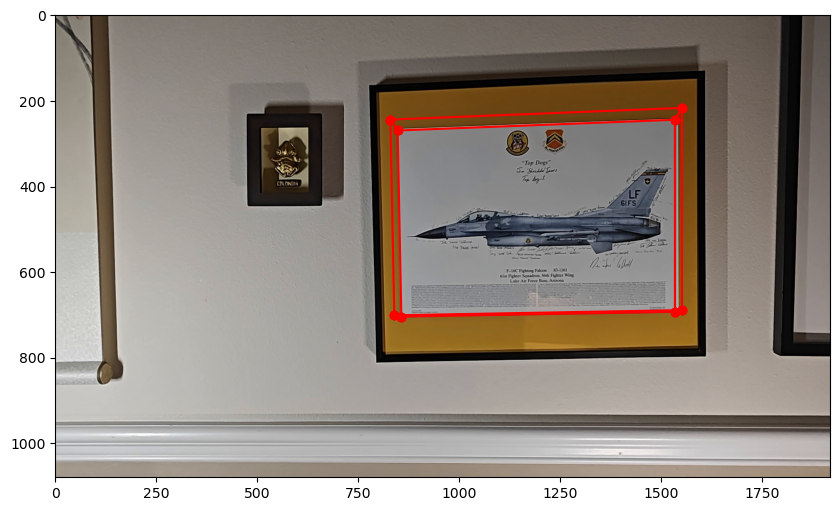

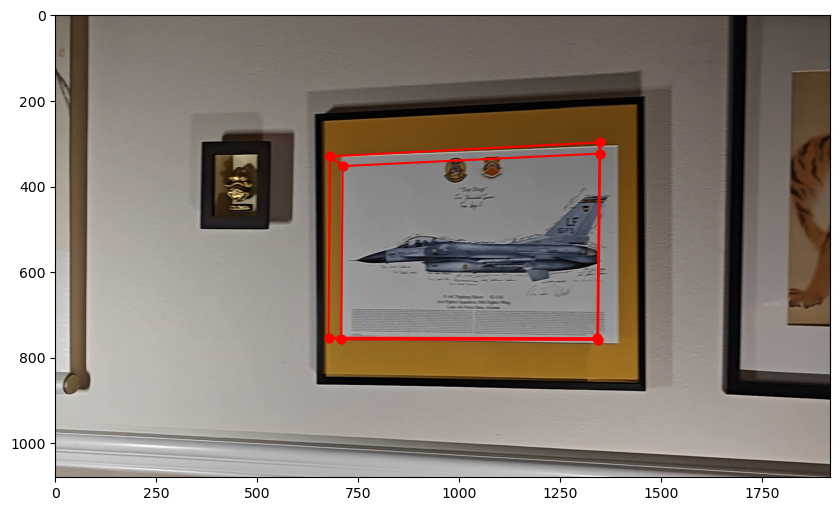

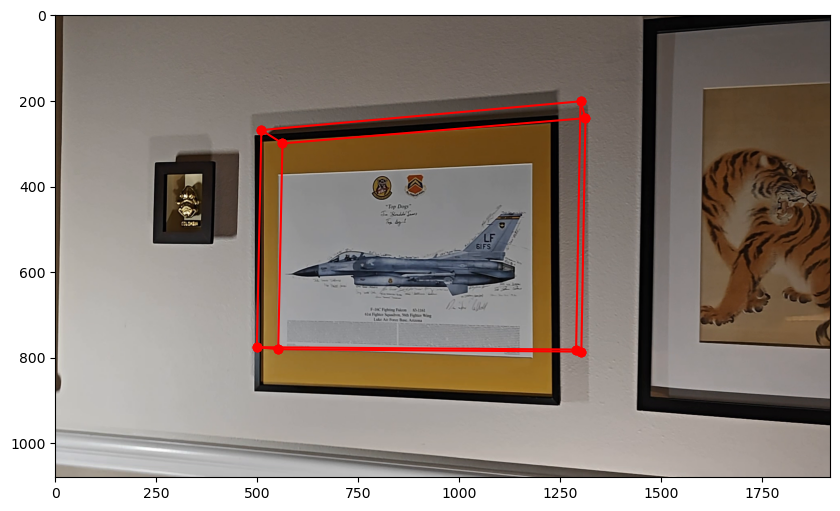

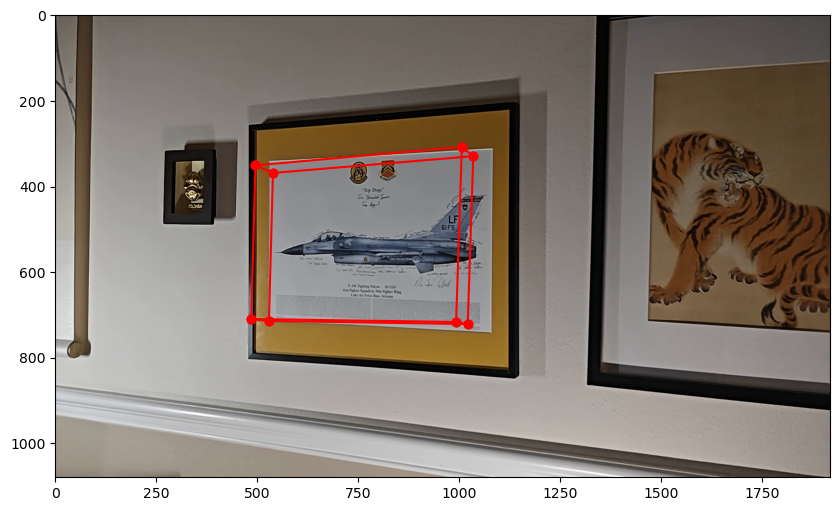

In [37]:
# Put virtual cubic on the images

for idx in range(len(imgs)):
    img = imgs[idx]
    # single camera matrix
    singlematrix = camera_matrix @ cameraTransform[idx]
    
    # projecting
    x = projecting(singlematrix, virtualcube)

    # plot
    plotting(x, img, camera_matrix, distortion_coeffs)
